# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


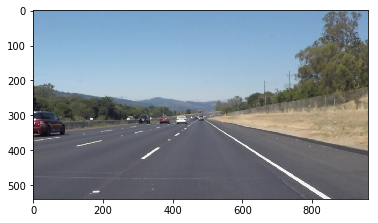

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [3]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    lhs_slopes=[]
    rhs_slopes=[]
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)
            slope=((y2-y1)/(x2-x1))
            if slope < 0 :
                lhs_slopes.append(slope)               
            else :
                rhs_slopes.append(slope)
    
    print('Total number of lines : ',len(lines),'left :',len(lhs_slopes),'right : ',len(rhs_slopes))
    
          
            
            
def get_point(slope,intercept,y1):
    # Derive coordinate point based on given slope, intercept and y coordinate
    try :
        x1=int(round((y1-intercept)/slope))
        return (x1,y1)
    except ValueError:
        print('slope ' , slope)
        print('intercept ',intercept)
        print('y1 ',y1)
        return None
        
'''
New draw line function to find extended distince lane lines.
'''            
def draw_lines1(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    thickness=5
    height,width,_=img.shape
    
    lhs_slopes=[]
    lhs_intercepts=[]
    
    rhs_slopes=[]
    rhs_intercepts=[]
    
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope=((y2-y1)/(x2-x1))
            #print("slope =",slope)
            y_intercept=y1-x1*slope
            #y_intercept2=y2-x2*slope
            #print("y_intercept1 = ",y_intercept1)
            
            if slope < 0 :
                lhs_slopes.append(slope)
                lhs_intercepts.append(y_intercept)
            else :
                rhs_slopes.append(slope)
                rhs_intercepts.append(y_intercept)
    
    if len(lhs_slopes) > 0 :
        avg_left_slope=sum(lhs_slopes)/float(len(lhs_slopes))
        avg_left_intercept=sum(lhs_intercepts)/float(len(lhs_intercepts))
    else :
        avg_left_slope=None
    
    if len(rhs_slopes) > 0 :
        avg_right_slope=sum(rhs_slopes)/float(len(rhs_slopes))
        avg_right_intercept=sum(rhs_intercepts)/float(len(rhs_intercepts))
    else :
        avg_right_slope=None
        
    
            
    
    # derive points at bottom of image height=539 and near to mid level height=340
    mid_level=int(round(height*0.6))
    # x =(y-b)/m
    if avg_left_slope : 
        # x =(y-b)/m
        #print('avg left slop ', avg_left_slope)
        #print('avg left intercept', avg_left_intercept)
        pointL1=get_point(avg_left_slope,avg_left_intercept,height)
        pointL2=get_point(avg_left_slope,avg_left_intercept,mid_level)
        
        if (pointL1 and pointL2): # if there is no issue is finding line 
            cv2.line(img, pointL1, pointL2, color, thickness)
    
    if avg_right_slope :
        # x =(y-b)/m
        #print('avg right slop ', avg_right_slope)
        #print('avg right intercept', avg_right_intercept)
        pointR1=get_point(avg_right_slope,avg_right_intercept,height)
        pointR2=get_point(avg_right_slope,avg_right_intercept,mid_level)
        
        if (pointR1 and pointR2): # if there is no issue is finding line 
            cv2.line(img, pointR1, pointR2, color, thickness)
    
    
    
    

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

def hough_lines1(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines1(line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

In [4]:
import os
os.listdir("test_images/")

['solidWhiteCurve.jpg',
 'solidWhiteRight.jpg',
 'solidYellowCurve.jpg',
 'solidYellowCurve2.jpg',
 'solidYellowLeft.jpg',
 'whiteCarLaneSwitch.jpg']

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

In [5]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images_output directory.

In [6]:
# My helper methods 

# Plot multiple images using plt.subplot
def plot_multiple_images(images,file_names,gray=False):
    
    number_of_images=len(images)
    number_of_cols=2
    number_of_rows=int(round(number_of_images/number_of_cols))
    
    # adjust figure size to maintain image aspect ratio near to 1.7778
    fig_width=7.4*number_of_cols  
    fig_height=4.05*number_of_rows
    
    if number_of_rows > 4 :
        _dpi = number_of_rows * 18
    else :
        _dpi = 75
    
    fig=plt.figure(figsize=(fig_width, fig_height),dpi=_dpi, facecolor='w', edgecolor='w')
    
    im_number=0
    for im, file_name in zip(images,file_names):
        im_number+=1
        plt.subplot(number_of_rows,number_of_cols,im_number)
        plt.title(file_name)
        if gray :
            plt.imshow(im,cmap='gray')
        else :
            plt.imshow(im)
            
from scipy.misc import imsave, imresize

def save_image(file_name,image):
    new_arr=image.copy()
    resized=imresize(new_arr,(200,355))
    imsave(file_name,resized)

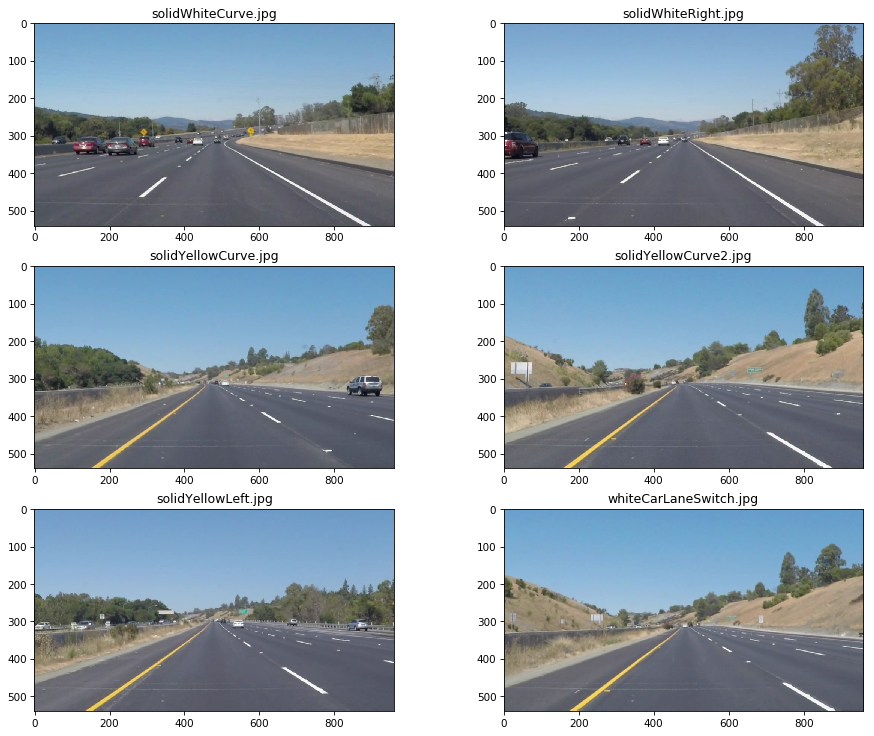

In [7]:

"""
Inspect the given images
Make use of matplot lib subplot to see all images in one cell
"""
from os.path import join

images=[]
file_names=[]

for im_file in os.listdir("test_images/") : 
    file_path=join('test_images',im_file)
    image = mpimg.imread(file_path)
    images.append(image)
    file_names.append(im_file)

plot_multiple_images(images,file_names)

# Would use Canny algorithm to find edges

## Step 1 and 2 : Convert images to grayscale and apply guassian blur

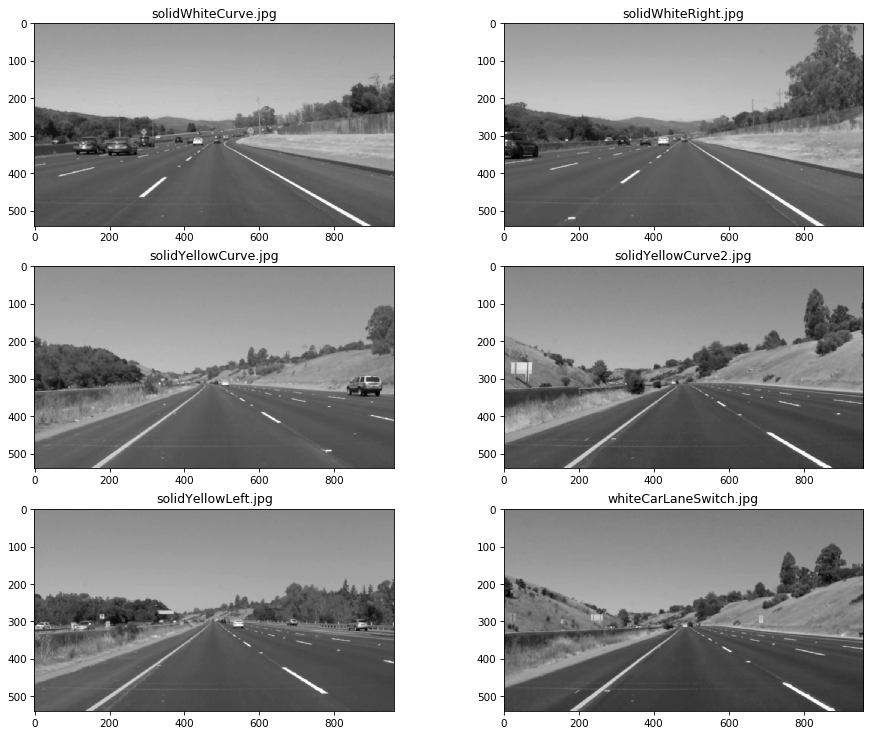

In [8]:
# get gray images
gray_images=[]

for im in images:
    gray_images.append(grayscale(im))

blur_images=[]
kernel_size=5 
for im in gray_images:
    blur_images.append(gaussian_blur(im,kernel_size))

# plot blur images
plot_multiple_images(blur_images,file_names,gray=True)

In [9]:
# save sample image to disc (355 x 200)
#save_image('sample_images/p1_step1.jpg',gray_images[3])
#save_image('sample_images/p1_step2.jpg',blur_images[3])



## Step 3 : Find edges in images using canny

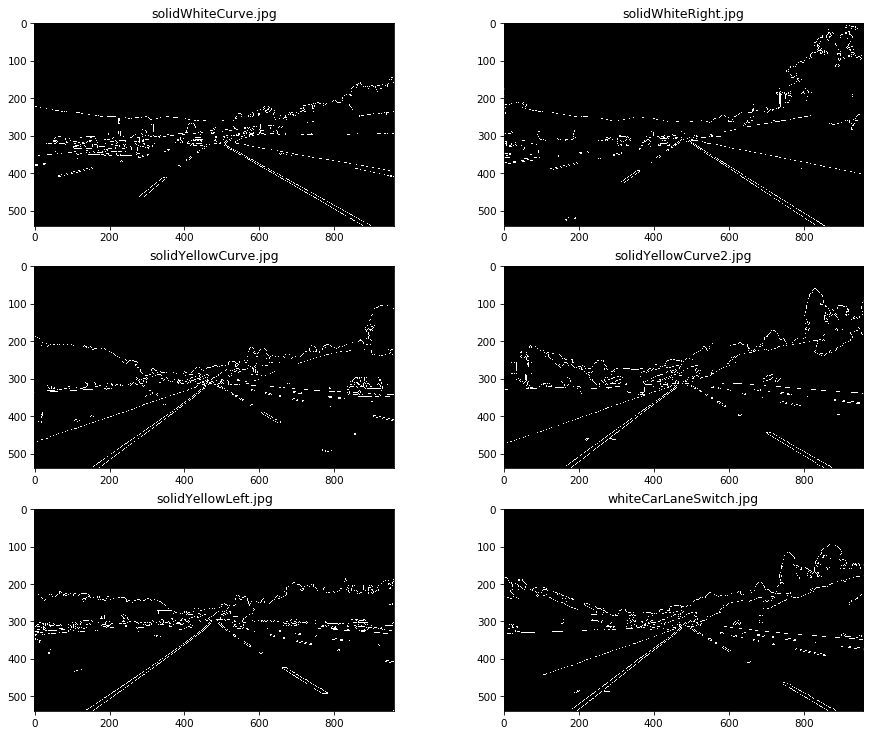

In [10]:
#parameters for Canny 
low_threshold = 50
high_threshold = 150

edge_images=[]
for im in blur_images:
    edge_images.append(canny(im,low_threshold,high_threshold))
    

# plot blur images
plot_multiple_images(edge_images,file_names,gray=True)

In [11]:
# save sample image to disc (355 x 200)
#save_image('sample_images/p1_step3.jpg',edge_images[3])

## Step 4 :  Use polygon mask to get area of interest

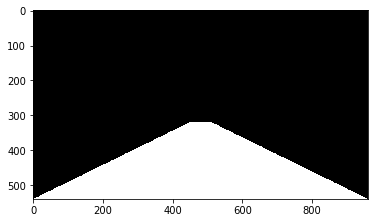

In [12]:
# create a masked edges image using cv2.fillPoly()
mask = np.zeros_like(edge_images[0])   
ignore_mask_color = 255   

imshape = edge_images[0].shape
vertices = np.array([[(0,imshape[0]),(450, 320), (510, 320), (imshape[1],imshape[0])]], dtype=np.int32)
cv2.fillPoly(mask, vertices, ignore_mask_color)

plt.imshow(mask, cmap='Greys_r')

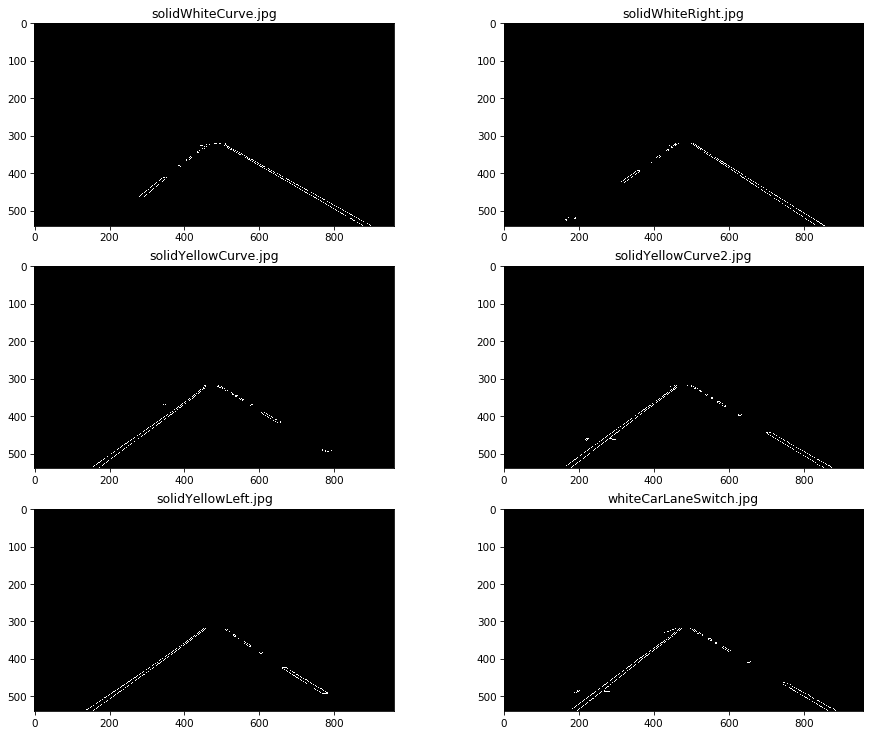

In [13]:
masked_images=[]

for im in edge_images:
    masked_images.append(region_of_interest(im, vertices))

plot_multiple_images(masked_images,file_names,gray=True)

In [14]:
#save_image('sample_images/p1_step4.jpg',masked_images[3])

## Step 5 : Find lines from edges using Hough transformation

lines for image  solidWhiteCurve.jpg
Total number of lines :  11 left : 5 right :  6
lines for image  solidWhiteRight.jpg
Total number of lines :  12 left : 6 right :  6
lines for image  solidYellowCurve.jpg
Total number of lines :  10 left : 5 right :  5
lines for image  solidYellowCurve2.jpg
Total number of lines :  14 left : 6 right :  8
lines for image  solidYellowLeft.jpg
Total number of lines :  11 left : 5 right :  6
lines for image  whiteCarLaneSwitch.jpg
Total number of lines :  10 left : 5 right :  5


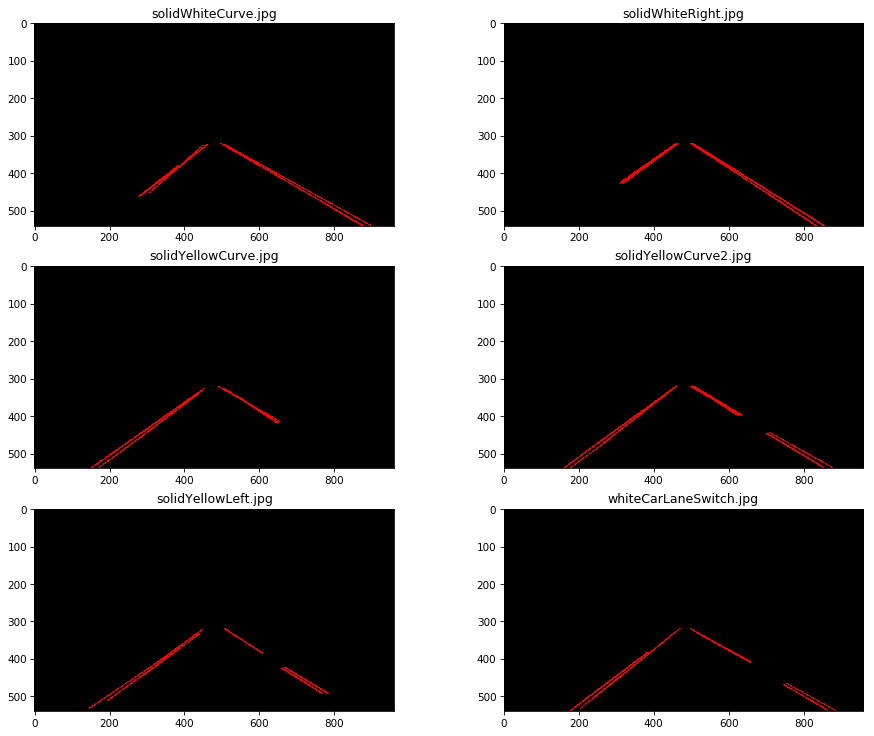

In [15]:
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 4    # minimum number of votes (intersections in Hough grid cell)  # good values 4
min_line_length = 100 # minimum number of pixels making up a line 
max_line_gap = 50    # maximum gap in pixels between connectable line segments 

line_images=[]

for im,file_name in zip(masked_images,file_names) :
    print('lines for image ', file_name)
    line_images.append(hough_lines(im, rho, theta, threshold, min_line_length, max_line_gap))
    
plot_multiple_images(line_images,file_names,gray=True)

In [16]:
#save_image('sample_images/p1_step5.jpg',line_images[3])

## Step 6 : Merge lines on original images

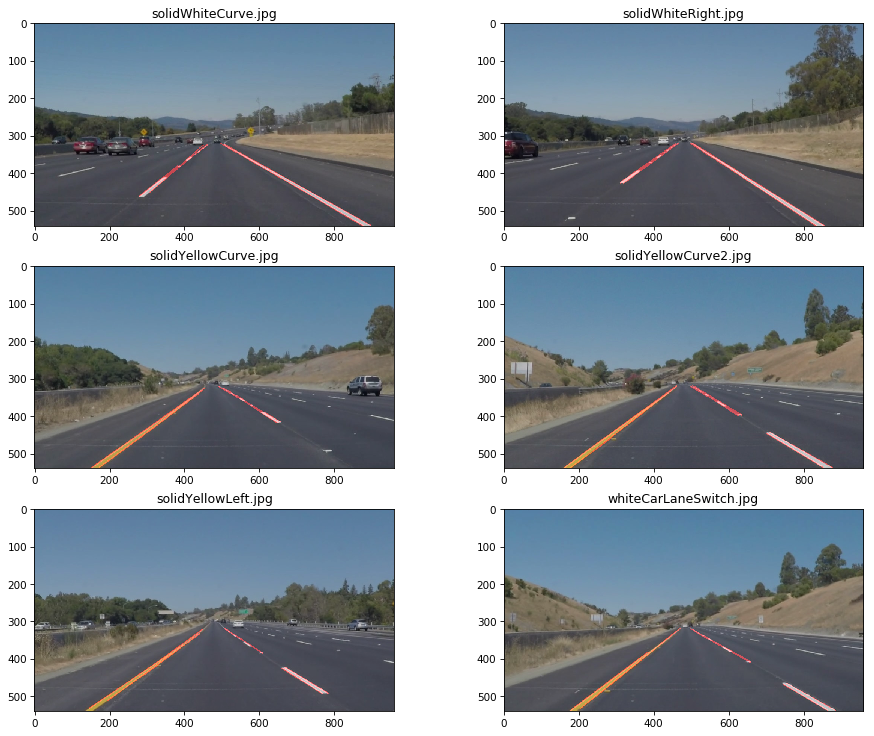

In [17]:
merged_images=[]

for line_im,image in zip(line_images,images):
    merged_images.append(weighted_img(line_im, image, α=0.8, β=0.5, γ=0.))


plot_multiple_images(merged_images,file_names,gray=False)

In [18]:
#save_image('sample_images/p1_step6.jpg',merged_images[3])

D:\softs\anaconda2\anaconda\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:35: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
D:\softs\anaconda2\anaconda\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:36: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


## Step 7 :  Render images after modified draw_lines() method

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

lines for image  solidWhiteCurve.jpg
lines for image  solidWhiteRight.jpg
lines for image  solidYellowCurve.jpg
lines for image  solidYellowCurve2.jpg
lines for image  solidYellowLeft.jpg
lines for image  whiteCarLaneSwitch.jpg


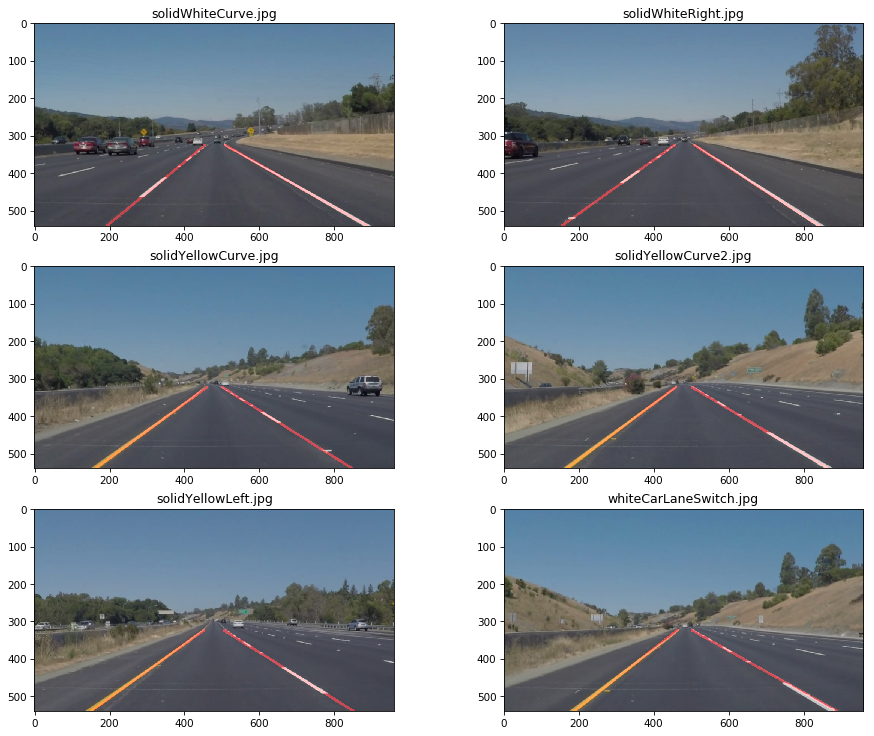

In [19]:
merged_line_images=[]

for im,file_name in zip(masked_images,file_names) :
    print('lines for image ', file_name)
    merged_line_images.append(hough_lines1(im, rho, theta, threshold, min_line_length, max_line_gap))

merged_images_new=[]
#plot_multiple_images(line_images,file_names,gray=True)
for line_im,image in zip(merged_line_images,images):
    merged_images_new.append(weighted_img(line_im, image, α=0.8, β=0.5, γ=0.))


plot_multiple_images(merged_images_new,file_names,gray=False)

In [20]:
# save images for referance
#save_image('sample_images/p1_step7.jpg',merged_line_images[3])
#save_image('sample_images/p1_step8.jpg',merged_images_new[3])

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [21]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Image processing for Video stream.

In [22]:
# hough transforma parameters
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 4    # minimum number of votes (intersections in Hough grid cell)  # good values 4
min_line_length = 100 # minimum number of pixels making up a line 
max_line_gap = 50    # maximum gap in pixels between connectable line segments 

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    
    # convert image to gray scale
    gray_image=grayscale(image)
    
    # apply remove noise by gaussian
    kernel_size=5
    blur_image=gaussian_blur(gray_image,kernel_size)
    
    #Get edges with canny algorithm
    #parameters for Canny 
    low_threshold = 50
    high_threshold = 150
    edges=canny(blur_image,low_threshold,high_threshold)
    
    #print("edges shape ", edges.shape,"edges type", type(edges))
    
    #do masking
    im_height,im_width,_=image.shape
    mid_level=int(round(im_height*0.6)) # consider 40% from bottom
    # consider mid 6 % portion at top of polygon
    top_left_x=int(round(im_width*0.47))
    top_right_x=int(round(im_width*0.53))
    
    vertices = np.array([[(0,im_height),(top_left_x, mid_level), (top_right_x, mid_level), (im_width,im_height)]], dtype=np.int32)
    masked_edges=region_of_interest(edges, vertices)
    
    #print("masked_edges shape ", masked_edges.shape,"masked_edges type", type(masked_edges))
    
    #find lines using Hough transformation
    #line_image=hough_lines1(masked_edges, rho, theta, threshold, min_line_length, max_line_gap)
    
    # use new draw_line method by calling hough_lines1
    line_image=hough_lines1(masked_edges, rho, theta, threshold, min_line_length, max_line_gap)
    
    #merge line image with original image
    result=weighted_img(line_image, image, α=0.8, β=0.5, γ=0.)
    
    return result

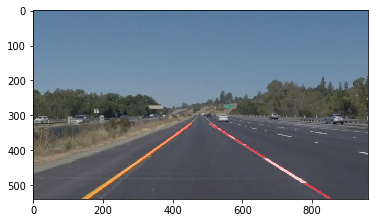

In [23]:
# Test process_image
new_img=process_image(images[4])
plt.imshow(new_img)

Let's try the one with the solid white lane on the right first ...

In [24]:
white_output = 'test_videos_output/solidWhiteRight.mp4'


## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

# commenting below to avoid os error : [WinError 6] The handle is invalid

'''
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)
del clip1.reader
del clip1
del white_clip
'''

'\nclip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")\nwhite_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!\n%time white_clip.write_videofile(white_output, audio=False)\ndel clip1.reader\ndel clip1\ndel white_clip\n'

Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

## Run below cell if video not already rendered

In [1]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('test_videos_output/solidWhiteRight.mp4'))

Now for the one with the solid yellow lane on the left. This one's more tricky!

## Video clip2 for yellow lines.

In [26]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)

# commenting below to avoid os error : [WinError 6] The handle is invalid

'''
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)
del clip2.reader
del clip2
del yellow_clip
'''


"\nclip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')\nyellow_clip = clip2.fl_image(process_image)\n%time yellow_clip.write_videofile(yellow_output, audio=False)\ndel clip2.reader\ndel clip2\ndel yellow_clip\n"

## Run below cell if video not already rendered

In [2]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('test_videos_output/solidYellowLeft.mp4'))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [28]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)

# commenting below to avoid os error : [WinError 6] The handle is invalid

'''
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)
del clip3
del challenge_clip
'''

"\nclip3 = VideoFileClip('test_videos/challenge.mp4')\nchallenge_clip = clip3.fl_image(process_image)\n%time challenge_clip.write_videofile(challenge_output, audio=False)\ndel clip3\ndel challenge_clip\n"

## Run below cell if video not already rendered

In [3]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('test_videos_output/challenge.mp4'))

### After running above pipeline on challange video I found that lane lines are running all over images and not overlapping with actual lanes. so would go for image by image inspection of all steps in above pipeline. 

## Extract images for abnormal part of video 

In [30]:
# extract images for abnormal part of video 
"""
clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(3.2,4.6) # 3.2,4.6
list_of_files=clip3.write_images_sequence('challenge_images/frame%03d.jpg',fps=4)

clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(5.5,6.5) # 3.2,4.6
list_of_files=clip3.write_images_sequence('challenge_images/frame1%03d.jpg',fps=4)
"""

"\nclip3 = VideoFileClip('test_videos/challenge.mp4').subclip(3.2,4.6) # 3.2,4.6\nlist_of_files=clip3.write_images_sequence('challenge_images/frame%03d.jpg',fps=4)\n\nclip3 = VideoFileClip('test_videos/challenge.mp4').subclip(5.5,6.5) # 3.2,4.6\nlist_of_files=clip3.write_images_sequence('challenge_images/frame1%03d.jpg',fps=4)\n"

In [31]:
challange_images=os.listdir('challenge_images')
print(len(challange_images))
challange_images.sort()
print(challange_images)

10
['frame000.jpg', 'frame001.jpg', 'frame002.jpg', 'frame003.jpg', 'frame004.jpg', 'frame005.jpg', 'frame1000.jpg', 'frame1001.jpg', 'frame1002.jpg', 'frame1003.jpg']


number_of_rows 5


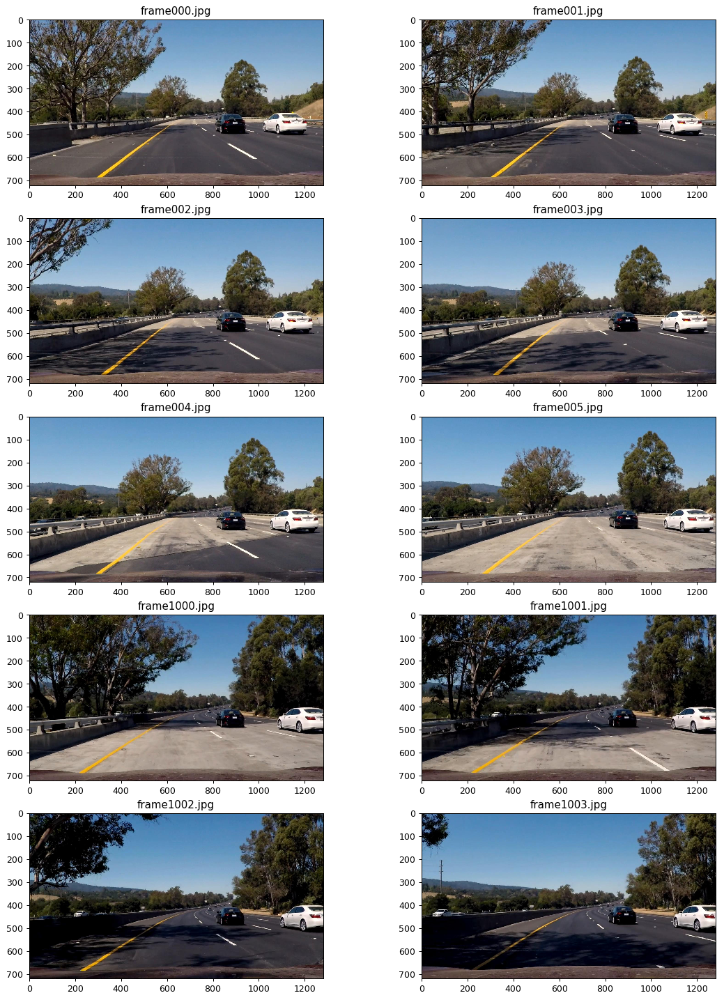

In [32]:
ch_images=[]
ch_file_names=[]

number_of_images=len(challange_images)
number_of_cols=2
number_of_rows=int(round(number_of_images/number_of_cols))

print('number_of_rows',number_of_rows)

for im_file in challange_images : 
    file_path=join('challenge_images',im_file)
    image = mpimg.imread(file_path)
    ch_images.append(image)
    ch_file_names.append(im_file)

plot_multiple_images(ch_images,ch_file_names)

## Get edge images

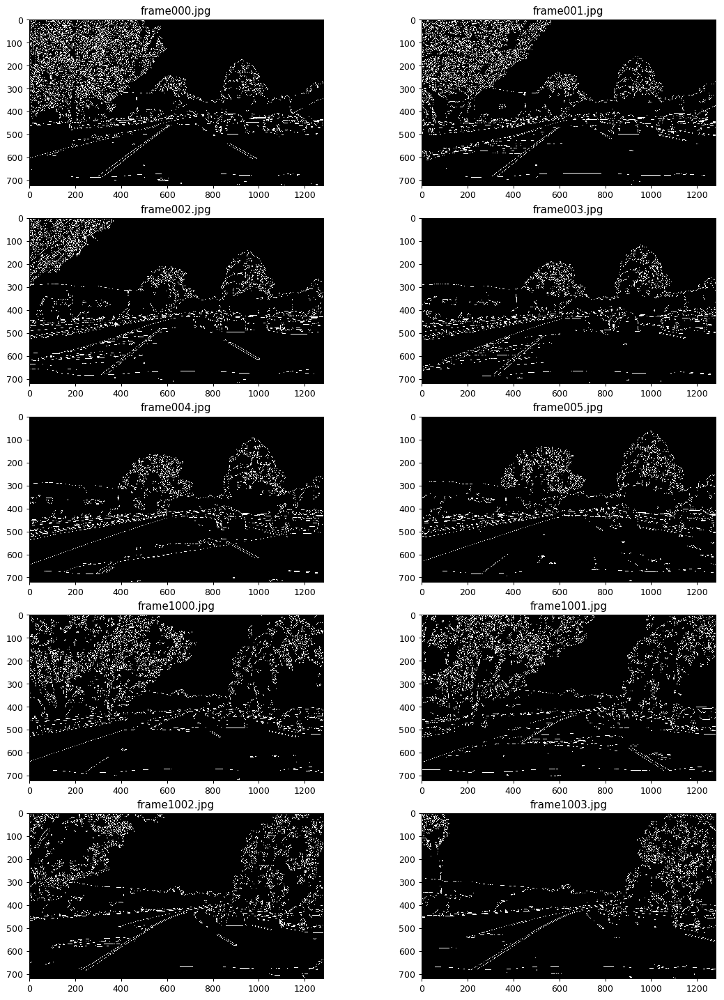

In [33]:
# get edgges images
ch_edge_images=[]
kernel_size=5

#parameters for Canny 
low_threshold = 50
high_threshold = 150

for im in ch_images:
    ch_gray_image=grayscale(im)
    ch_blur_image=gaussian_blur(ch_gray_image,kernel_size)
    edge_image=canny(ch_blur_image,low_threshold,high_threshold)
    ch_edge_images.append(edge_image)

#plot edges
plot_multiple_images(ch_edge_images,ch_file_names,gray=True)

## Findings so for 

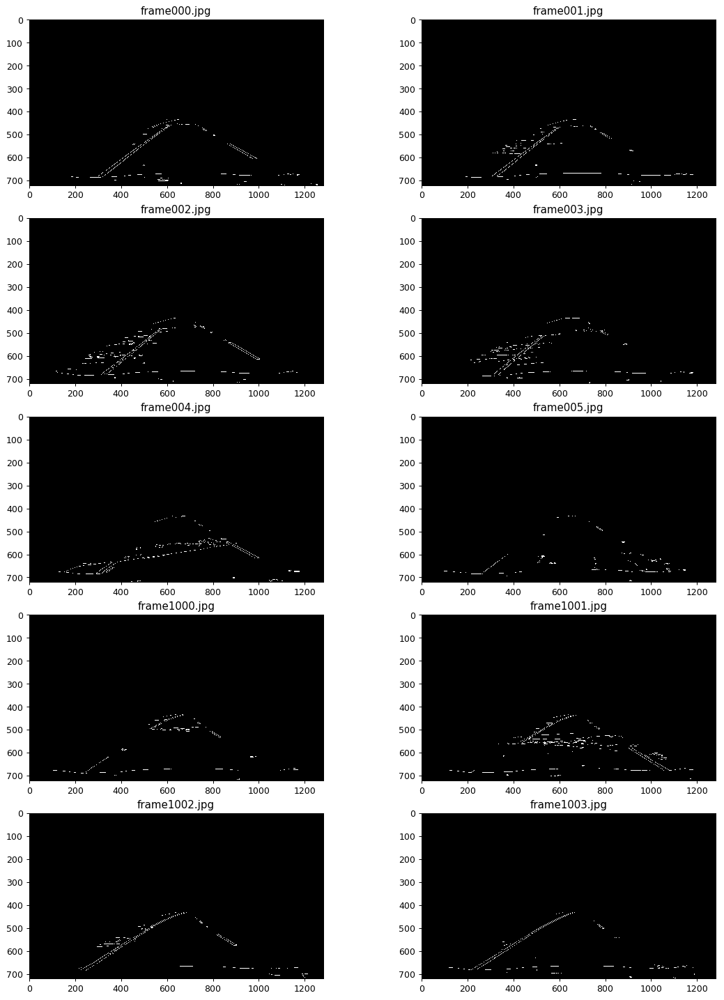

In [34]:
im_height,im_width=ch_edge_images[0].shape
mid_level=int(round(im_height*0.6)) # consider 40% from bottom
# consider mid 6 % portion at top
top_left_x=int(round(im_width*0.47))
top_right_x=int(round(im_width*0.53))

vertices = np.array([[(0,im_height),(top_left_x, mid_level), (top_right_x, mid_level), (im_width,im_height)]], dtype=np.int32)

ch_masked_images=[]

for im in ch_edge_images:
    ch_masked_images.append(region_of_interest(im, vertices))

plot_multiple_images(ch_masked_images,ch_file_names,gray=True)

## Get hough lines

In [35]:
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 4    # minimum number of votes (intersections in Hough grid cell)  # good values 4
min_line_length = 100 # minimum number of pixels making up a line 
max_line_gap = 50    # maximum gap in pixels between connectable line segments 

ch_line_images=[]

for im, f_name in zip(ch_masked_images,ch_file_names) :
    print('lines in image ',f_name)
    ch_line_images.append(hough_lines(im, rho, theta, threshold, min_line_length, max_line_gap))    


lines in image  frame000.jpg
Total number of lines :  18 left : 13 right :  5
lines in image  frame001.jpg
Total number of lines :  33 left : 30 right :  3
lines in image  frame002.jpg
Total number of lines :  43 left : 30 right :  13
lines in image  frame003.jpg
Total number of lines :  47 left : 39 right :  8
lines in image  frame004.jpg
Total number of lines :  25 left : 21 right :  4
lines in image  frame005.jpg
Total number of lines :  4 left : 1 right :  3
lines in image  frame1000.jpg
Total number of lines :  15 left : 11 right :  4
lines in image  frame1001.jpg
Total number of lines :  46 left : 23 right :  23
lines in image  frame1002.jpg
Total number of lines :  22 left : 17 right :  5
lines in image  frame1003.jpg
Total number of lines :  17 left : 12 right :  5


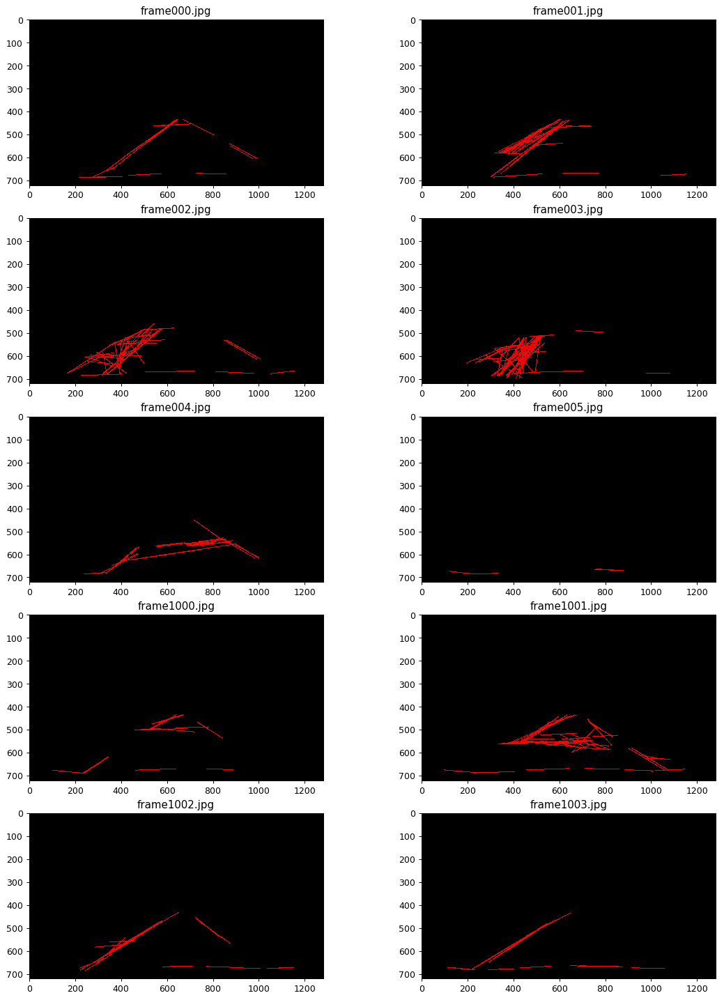

In [36]:
plot_multiple_images(ch_line_images,ch_file_names,gray=True)

frame000.jpg
frame001.jpg
frame002.jpg
frame003.jpg
slope  -inf
intercept  inf
y1  720
slope  -inf
intercept  inf
y1  432
frame004.jpg
frame005.jpg
frame1000.jpg
frame1001.jpg
frame1002.jpg
frame1003.jpg


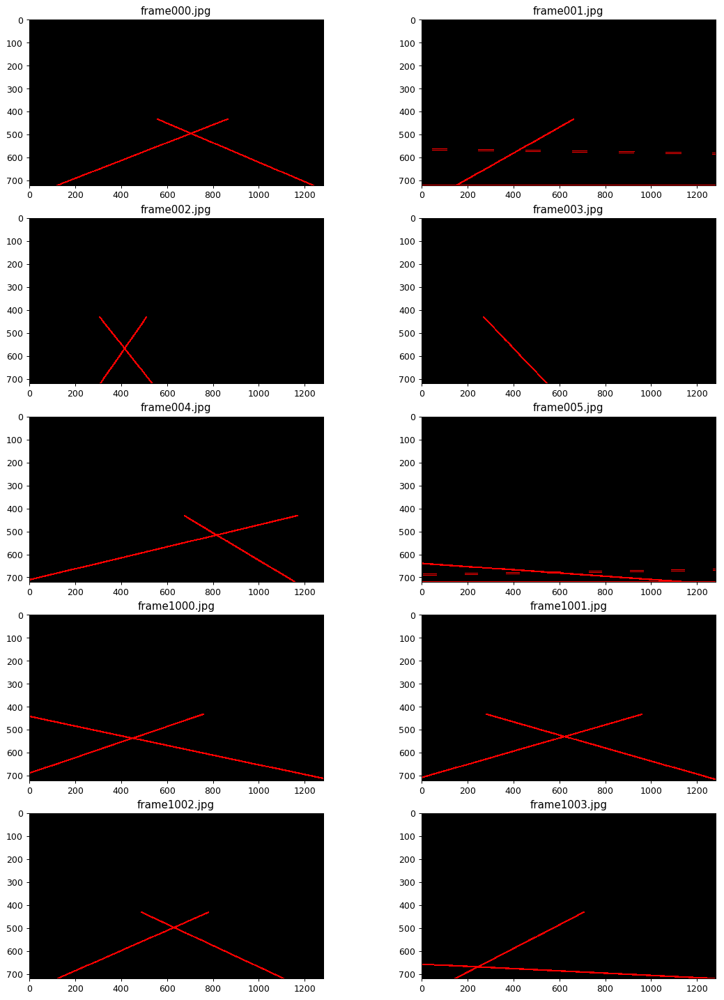

In [37]:
# Get avarage and extra polated lines
ch_extended_line_images=[]

for im,f_name in zip(ch_masked_images,ch_file_names) :
    print(f_name)
    ch_extended_line_images.append(hough_lines1(im, rho, theta, threshold, min_line_length, max_line_gap))
    
plot_multiple_images(ch_extended_line_images,ch_file_names,gray=True)

## Applying hough lines on images

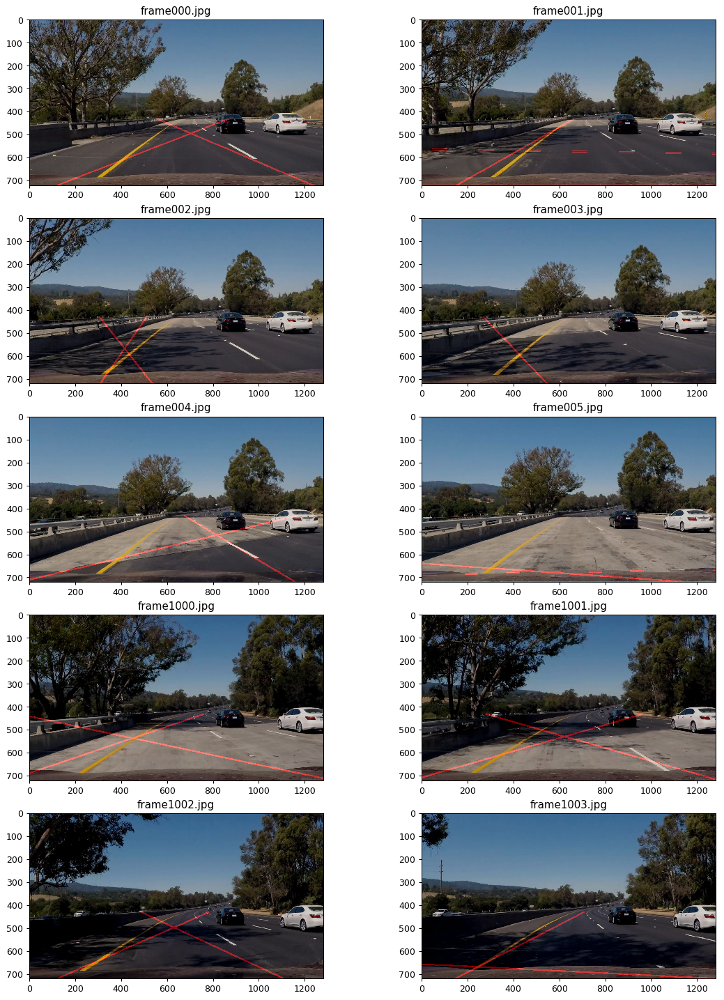

In [38]:
ch_images_new=[]
#plot_multiple_images(line_images,file_names,gray=True)
for line_im,image in zip(ch_extended_line_images,ch_images):
    ch_images_new.append(weighted_img(line_im, image, α=0.8, β=0.5, γ=0.))


plot_multiple_images(ch_images_new,ch_file_names,gray=False)

In [39]:
# Save images for reference in writeup
#save_image('sample_images/p1_ch_houghline1.jpg',ch_line_images[3])
#save_image('sample_images/p1_ch_houghline2.jpg',ch_line_images[4])
#save_image('sample_images/p1_ch_houghline3.jpg',ch_line_images[6])
#save_image('sample_images/p1_ch_houghline4.jpg',ch_line_images[9])

#save_image('sample_images/p1_ch_final1.jpg',ch_images_new[3])
#save_image('sample_images/p1_ch_final2.jpg',ch_images_new[4])
#save_image('sample_images/p1_ch_final3.jpg',ch_images_new[6])
#save_image('sample_images/p1_ch_final4.jpg',ch_images_new[9])


# Sortfalls in pipeline 1 

## Findings in with challange video
1. The avrage slope and intercept are no way near to acutal lane line slope and intercept. 
2. Yellow and white lanes not get properly detected in white patch of road
3. There are multiple horizantal white lines get detected in shadow portion (though lane lines can be seen)
4. Car bonnet producing horizontal lines at bottom portion. In white patch of road it is more highlighted may be due to glare. 
5. Road patch change from tar to concrete producing horizontal line.


## Try out with HLS color space

In [40]:
hls_images=[]

for im, file in zip(ch_images,ch_file_names):
    hls_im=cv2.cvtColor(im,cv2.COLOR_RGB2HLS)
    hls_images.append(hls_im)

## H channel

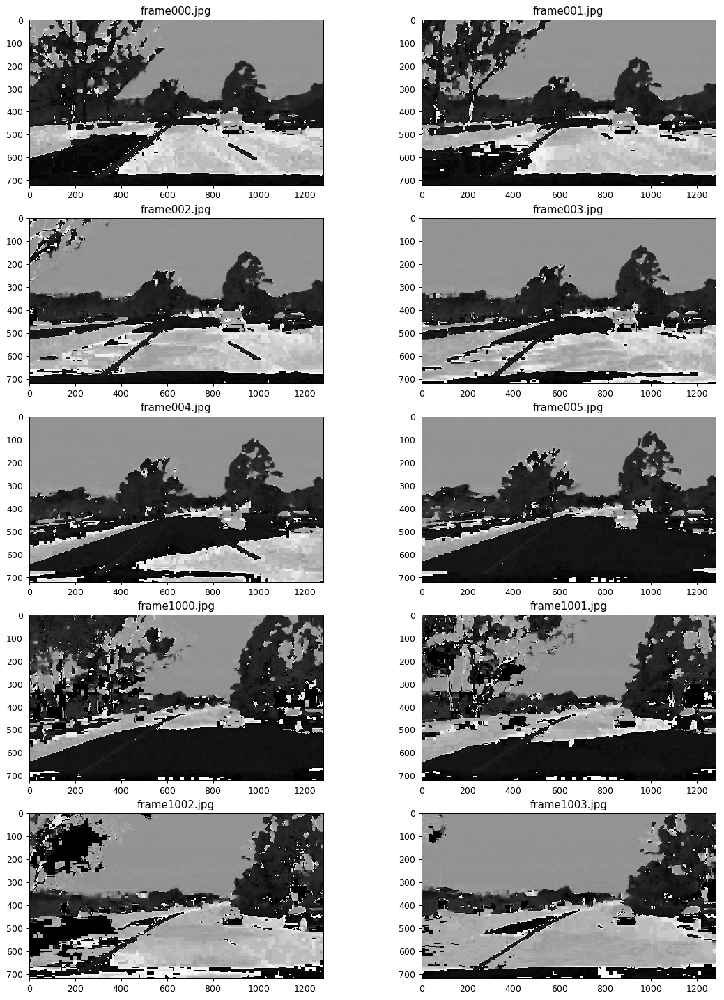

In [41]:
hls_h_channels=[]

for im in hls_images:
    h_channel=np.copy(im[:,:,0])
    hls_h_channels.append(h_channel)

plot_multiple_images(hls_h_channels,ch_file_names,gray=True)

## L channel

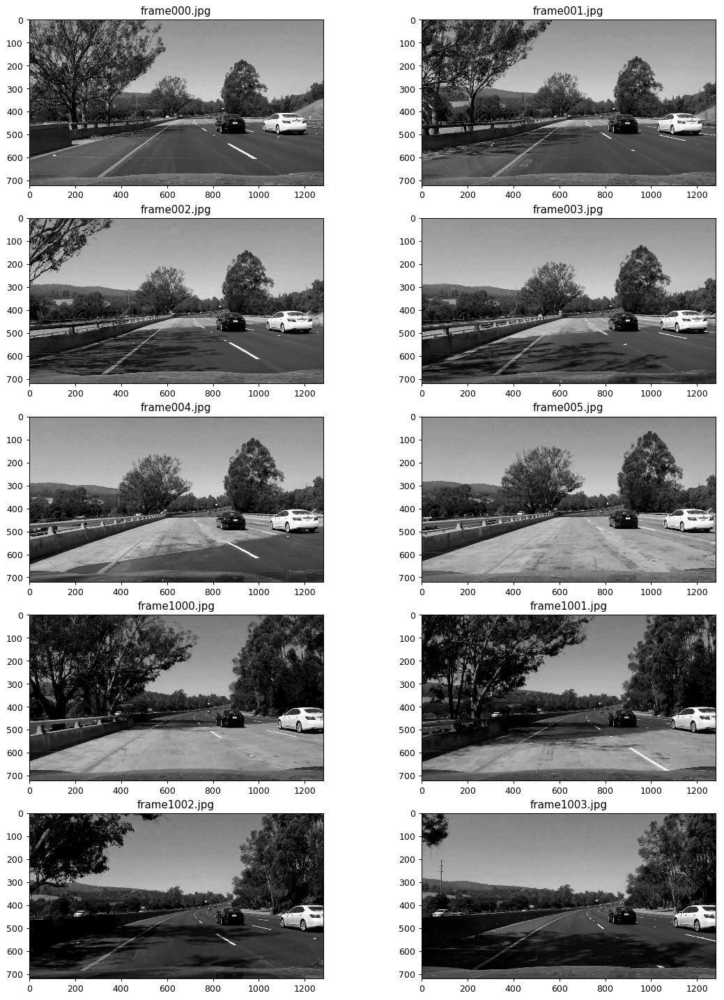

In [42]:
hls_l_channels=[]

for im in hls_images:
    l_channel=np.copy(im[:,:,1])
    hls_l_channels.append(l_channel)

plot_multiple_images(hls_l_channels,ch_file_names,gray=True)

## S channel

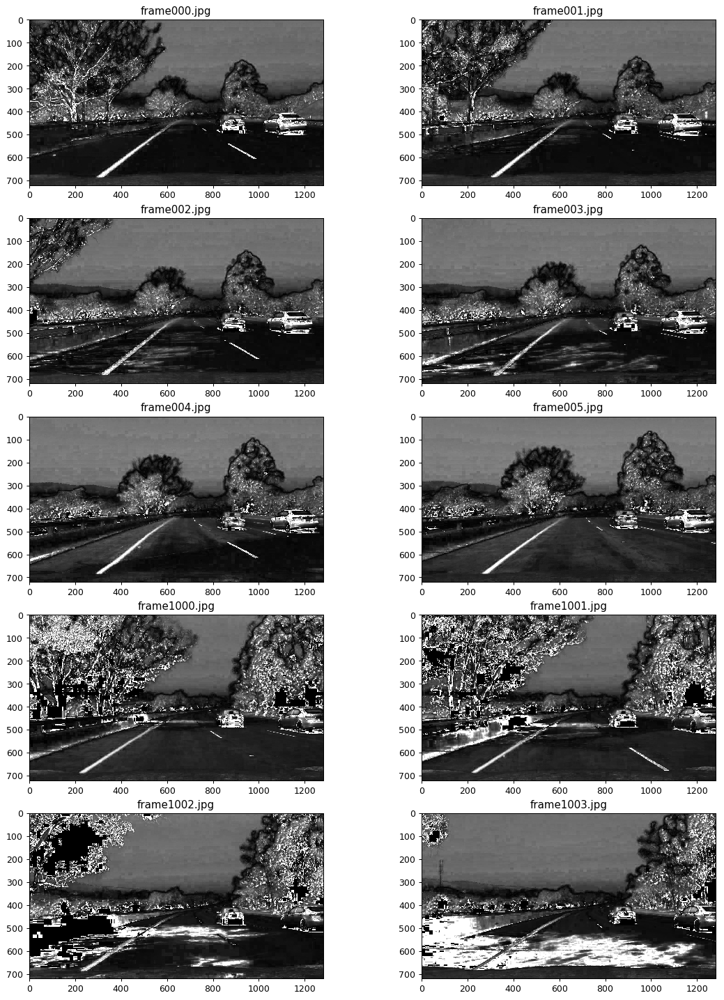

In [43]:
hls_s_channels=[]

for im in hls_images:
    s_channel=np.copy(im[:,:,2])
    hls_s_channels.append(s_channel)

plot_multiple_images(hls_s_channels,ch_file_names,gray=True)

## Observations

## S channel thresholding

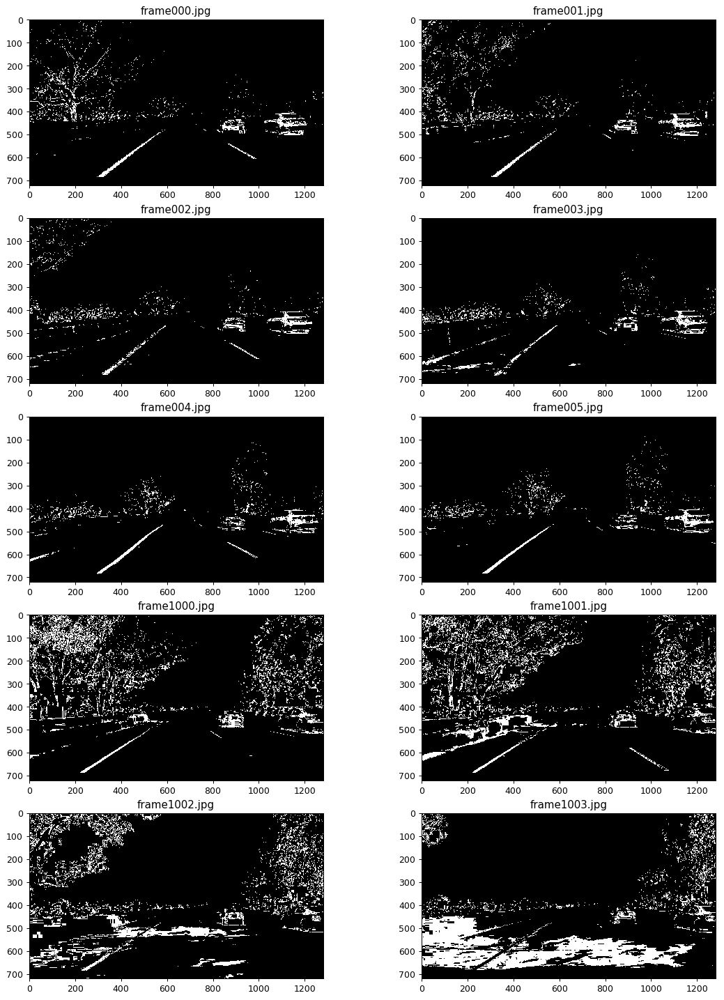

In [44]:
s_channel_binaries=[]
s_low_threshold=170
s_high_threshold=255

for hls_image in hls_images :
    filtered_s=np.zeros_like(hls_image[:,:,2])
    s_channel=hls_image[:,:,2].copy()
    threshold=(s_channel>s_low_threshold) & (s_channel<=s_high_threshold)
    filtered_s[threshold]=1
    s_channel_binaries.append(filtered_s)

plot_multiple_images(s_channel_binaries,ch_file_names,gray=True)

## H channel Thresholding

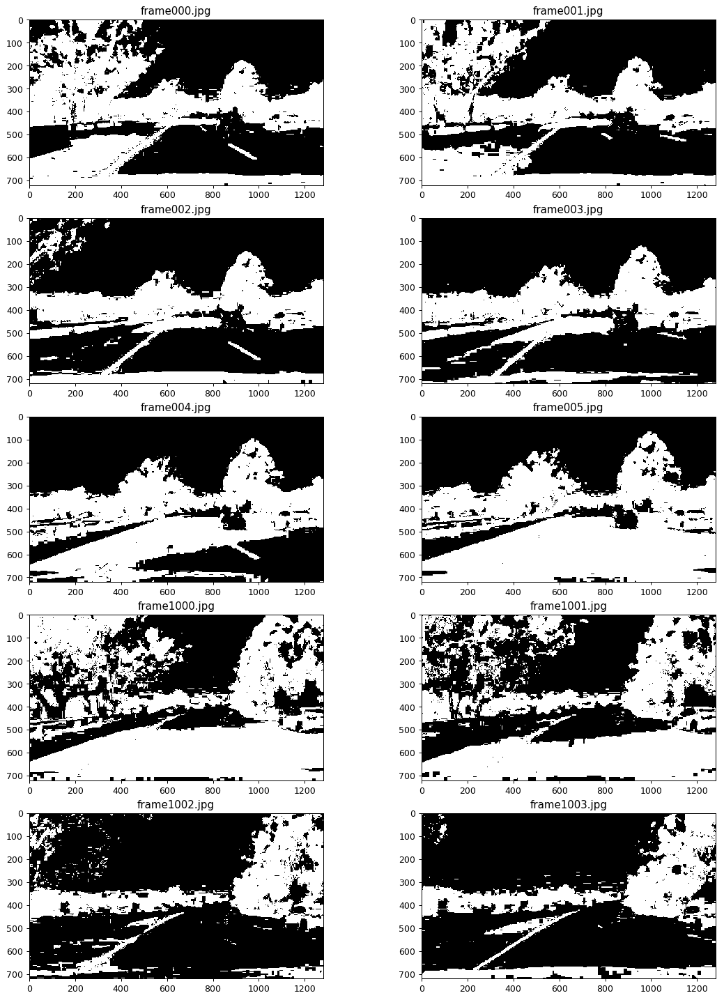

In [45]:
h_channel_binaries=[]
h_low_threshold=0
h_high_threshold=100

for hls_image in hls_images :
    filtered_h=np.zeros_like(hls_image[:,:,0])
    h_channel=hls_image[:,:,0]
    threshold=(h_channel>h_low_threshold) & (h_channel<=h_high_threshold)
    filtered_h[threshold]=1
    h_channel_binaries.append(filtered_h)

plot_multiple_images(h_channel_binaries,ch_file_names,gray=True)

## Combine thresholded S and H channel

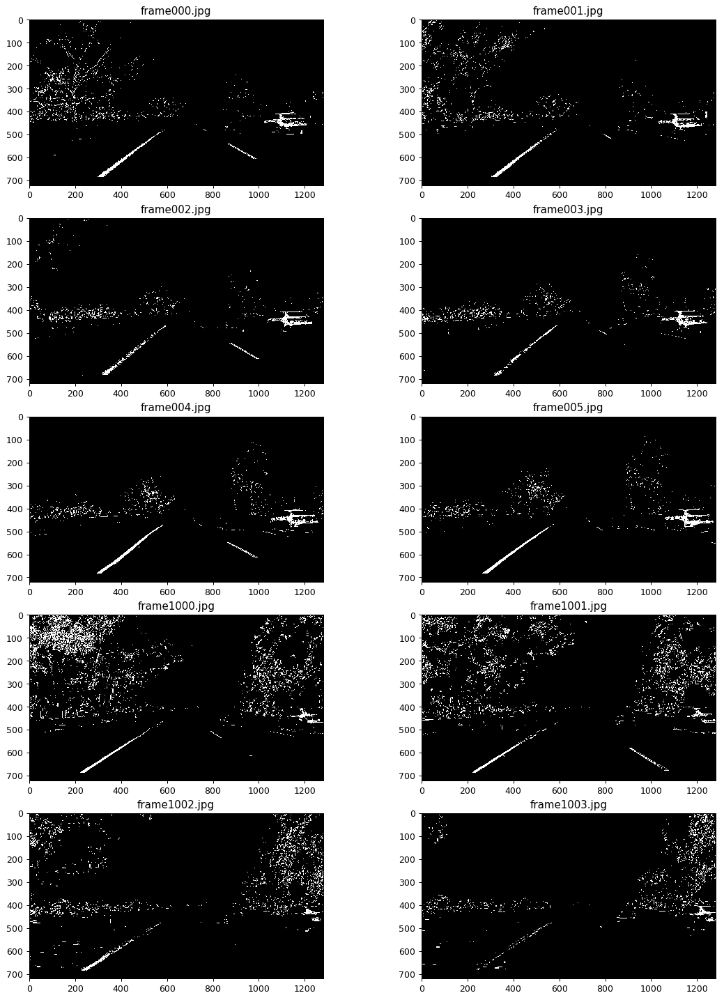

In [46]:
combined_s_h=[]

for s_binary,h_binary in zip(s_channel_binaries, h_channel_binaries) :
    filtered=np.zeros_like(s_binary)
    threshold=(s_binary==1) & (h_binary==1)
    filtered[threshold]=1
    combined_s_h.append(filtered)
    
plot_multiple_images(combined_s_h,ch_file_names,gray=True)

## Apply masking to get points in area of interest

(720, 1280)


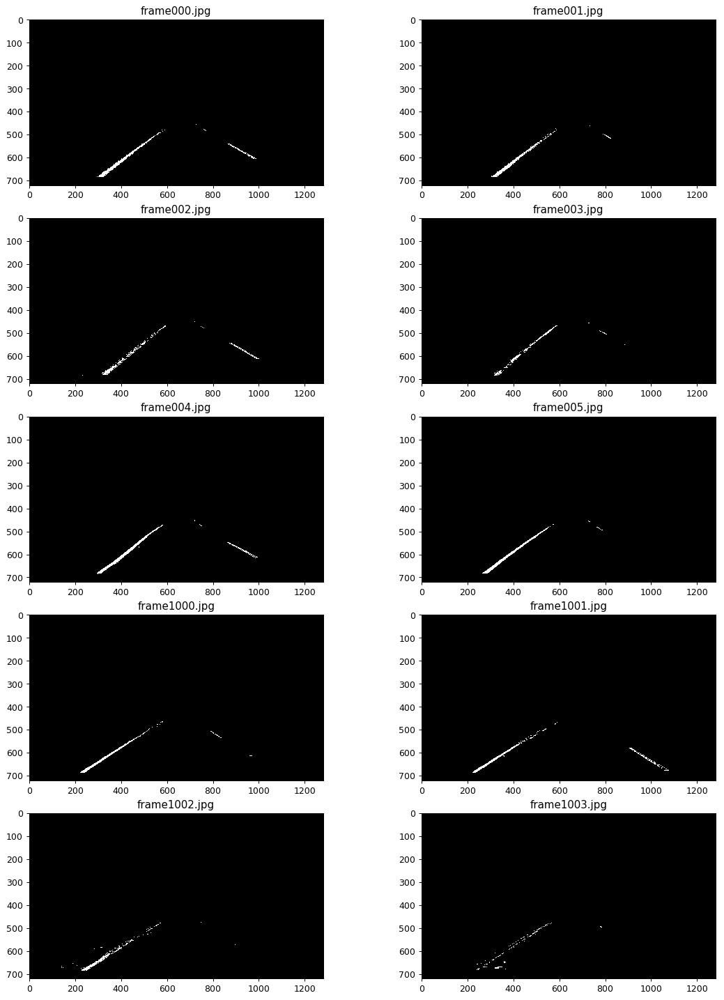

In [47]:
# apply masking 
im_height,im_width=combined_s_h[0].shape
mid_level=int(round(im_height*0.6)) # consider 40% from bottom
# consider mid 6 % portion at top of polygon
top_left_x=int(round(im_width*0.47))
top_right_x=int(round(im_width*0.53))

mask = np.zeros_like(combined_s_h[0])
 
vertices = np.array([[(0,im_height),(top_left_x, mid_level), (top_right_x, mid_level), (im_width,im_height)]], dtype=np.int32)

cv2.fillPoly(mask, vertices, 255)

masked_edges=[]
for im in combined_s_h:
    masked_image = cv2.bitwise_and(im, mask)
    masked_edges.append(masked_image)

print(masked_edges[0].shape)
plot_multiple_images(masked_edges,ch_file_names,gray=True)

## Get Hough lines

lines for image  frame000.jpg
Total number of lines :  19 left : 14 right :  5
lines for image  frame001.jpg
Total number of lines :  15 left : 15 right :  0
lines for image  frame002.jpg
Total number of lines :  23 left : 18 right :  5
lines for image  frame003.jpg
Total number of lines :  16 left : 16 right :  0
lines for image  frame004.jpg
Total number of lines :  21 left : 15 right :  6
lines for image  frame005.jpg
Total number of lines :  14 left : 14 right :  0
lines for image  frame1000.jpg
Total number of lines :  12 left : 12 right :  0
lines for image  frame1001.jpg
Total number of lines :  22 left : 13 right :  9
lines for image  frame1002.jpg
Total number of lines :  17 left : 17 right :  0
lines for image  frame1003.jpg
Total number of lines :  8 left : 8 right :  0


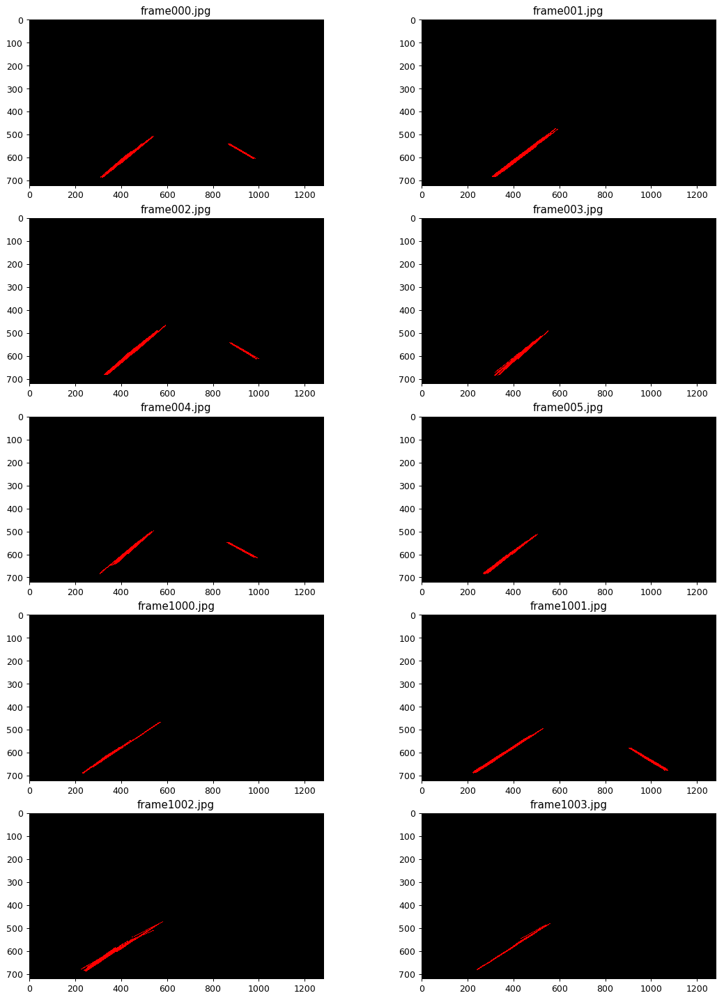

In [48]:
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 2    # minimum number of votes (intersections in Hough grid cell)  # good values 4
min_line_length = 100 # minimum number of pixels making up a line 
max_line_gap = 50    # maximum gap in pixels between connectable line segments 

ch_line_images=[]

for im,file_name in zip(masked_edges,ch_file_names) :
    print('lines for image ', file_name)
    ch_line_images.append(hough_lines(im, rho, theta, threshold, min_line_length, max_line_gap))
    
plot_multiple_images(ch_line_images,ch_file_names,gray=True)

## Exctrapolated lines

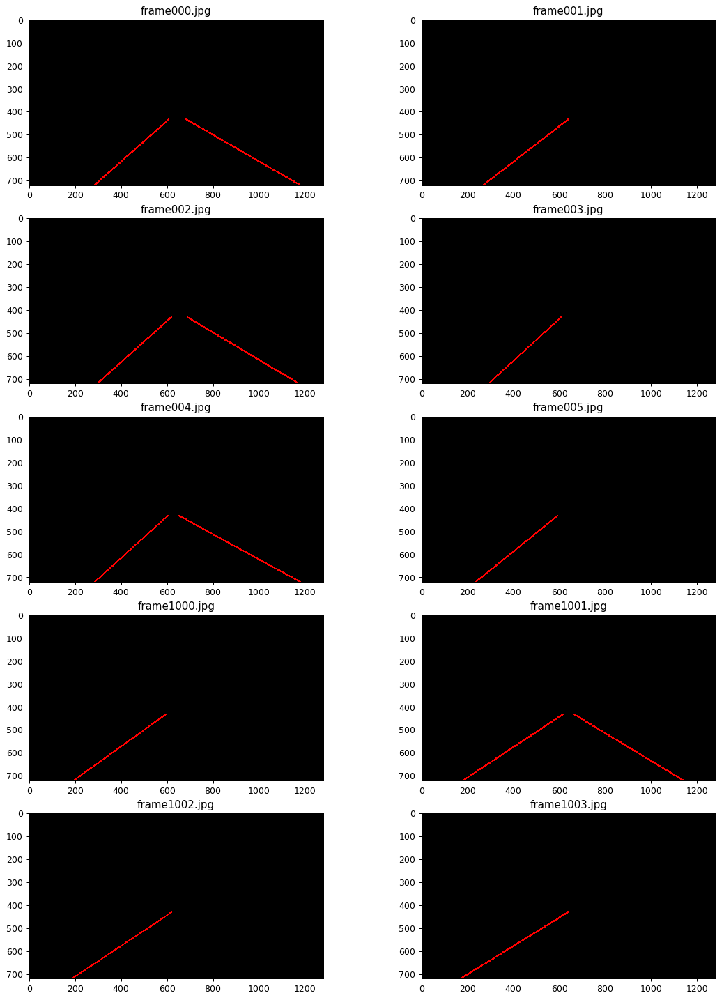

In [49]:
# Get avarage and extra polated lines
ch_line_images=[]

for im,f_name in zip(masked_edges,ch_file_names) :
   
    ch_line_images.append(hough_lines1(im, rho, theta, threshold, min_line_length, max_line_gap))
    
plot_multiple_images(ch_line_images,ch_file_names,gray=True)

## Merged hough lines with original images

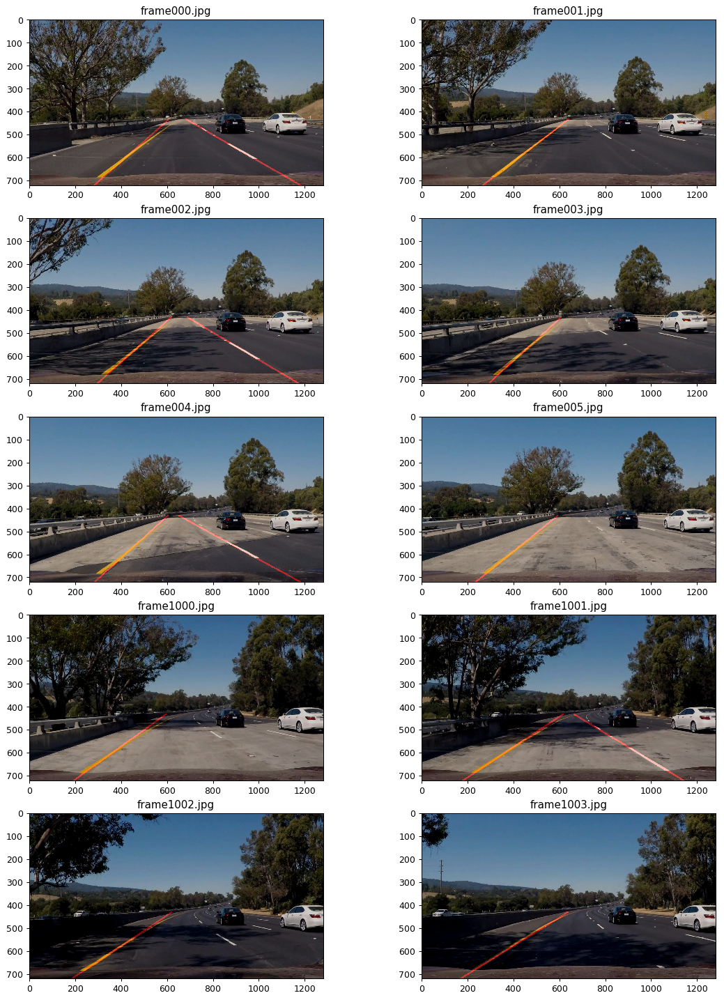

In [50]:
merged_images=[]

for line_im,image in zip(ch_line_images,ch_images):
    merged_images.append(weighted_img(line_im, image, α=0.8, β=0.5, γ=0.))


plot_multiple_images(merged_images,ch_file_names,gray=False)

## Points for new pipe line
1. This approch helps to find yellow lane line on white patch of road also.
2. However it can not detect white lane in shadow region and where lane is not continues in long stretch. 
3. As the vedio is on small curvature lane lines do not match with lanes in far away part of road. 

In [51]:
# save images for referance
#save_image('sample_images/p2_ch_final1.jpg',merged_images[3])
#save_image('sample_images/p2_ch_final2.jpg',merged_images[4])
#save_image('sample_images/p2_ch_final3.jpg',merged_images[6])
#save_image('sample_images/p2_ch_final4.jpg',merged_images[9])


In [52]:
# Create new pipe line

In [53]:
# hough transforma parameters

s_low_threshold=170
s_high_threshold=255

h_low_threshold=0
h_high_threshold=100

rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 2    # minimum number of votes (intersections in Hough grid cell)  # good values 4
min_line_length = 100 # minimum number of pixels making up a line 
max_line_gap = 50    # maximum gap in pixels between connectable line segments 

def process_image_new(image):
   
    # Get HLS space 
    hls_image=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    
    # Apply thresholding on S channle
    s_binary=np.zeros_like(hls_image[:,:,2])
    s_channel=hls_image[:,:,2].copy()
    s_threshold=(s_channel>s_low_threshold) & (s_channel<=s_high_threshold)
    s_binary[s_threshold]=1
    
    # Apply threshold on H channel
    h_binary=np.zeros_like(hls_image[:,:,0])
    h_channel=hls_image[:,:,0]
    h_threshold=(h_channel>h_low_threshold) & (h_channel<=h_high_threshold)
    h_binary[h_threshold]=1

    # Find combined region of thresholded S and H channel
    edges=np.zeros_like(s_binary)
    sh_threshold=(s_binary==1) & (h_binary==1)
    edges[sh_threshold]=1
    
    #print("edges shape ", edges.shape, "edges type", type(edges))
    
    #do masking
    im_height,im_width,_=image.shape
    mid_level=int(round(im_height*0.6)) # consider 40% from bottom
    # consider mid 6 % portion at top of polygon
    top_left_x=int(round(im_width*0.47))
    top_right_x=int(round(im_width*0.53))
    
    vertices = np.array([[(0,im_height),(top_left_x, mid_level), (top_right_x, mid_level), (im_width,im_height)]], dtype=np.int32)
    masked_edges=region_of_interest(edges, vertices)
    
    #print("masked edges shape ", masked_edges.shape,"masked_edges type", type(masked_edges))
    #print(rho, theta, threshold, min_line_length, max_line_gap)
    
    #find lines using Hough transformation
    line_image=hough_lines1(masked_edges, rho, theta, threshold, min_line_length, max_line_gap)
    
    #merge line image with original image
    result=weighted_img(line_image, image, α=0.8, β=0.5, γ=0.)
    
    return result

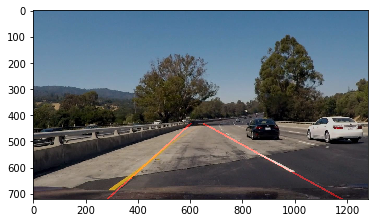

In [54]:
new_img=process_image_new(ch_images[4])
plt.imshow(new_img)

In [55]:
challenge_output_new = 'test_videos_output/challenge1.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip4 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)

# Commenting to avoid windows handle error
'''
clip4 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip1 = clip4.fl_image(process_image_new)
%time challenge_clip1.write_videofile(challenge_output_new, audio=False)
del clip4
del challenge_clip1
'''


"\nclip4 = VideoFileClip('test_videos/challenge.mp4')\nchallenge_clip1 = clip4.fl_image(process_image_new)\n%time challenge_clip1.write_videofile(challenge_output_new, audio=False)\ndel clip4\ndel challenge_clip1\n"

## Run below cell if video not already rendered

In [5]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('test_videos_output/challenge1.mp4'))

# Shortfalls

With new pipe line still there are following shortfalls
1. This approach helps to find yellow lane line on white patch of road also.
2. However it cannot detect white lane in shadow region and where lane is not continuing in long stretch. 
3. As the video is on small curvature, lane lines do not match with lanes in faraway part of road. 

# Possible improvements to new pipeline

1. Use combination HLS color space based extraction as specified above and club it with canny edge detection based on RGB color space.
2. Use some method to find edges to find only vertical lines instead of horizontal lines.
3. Use some good region selection method which could be applied on curve lanes.
4. Use some method to create curve lane line instead of straight one.